# Beans

## Setup

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np

# Preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler

# Something
from sklearn.neighbors import NearestNeighbors

# Dimensionality Reduction
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import DBSCAN

# Validation
from sklearn.metrics import silhouette_score

# Visualization
import matplotlib.pyplot as plt
import umap

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10
output_notebook()

Loading BokehJS ...

In [3]:
X_train = pd.read_excel("./Dry_Bean_Dataset/Dry_Bean_Dataset.xlsx")
X_train.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


## Understanding Data

### Correlation

C:\Users\samue\AppData\Local\Temp\ipykernel_22548\4293785987.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(X_train.corr(), fignum=f.number)


Text(0.5, 1.0, 'Correlation Matrix')

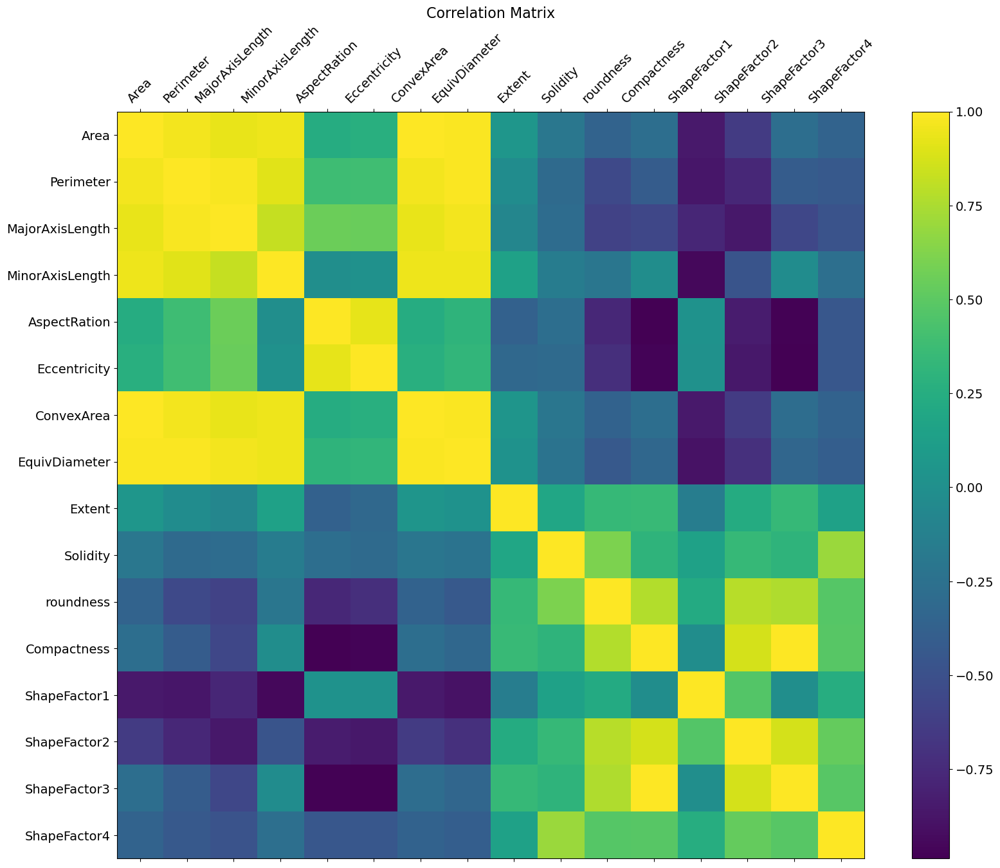

In [4]:
f = plt.figure(figsize=(19, 15))
plt.matshow(X_train.corr(), fignum=f.number)
plt.xticks(range(X_train.select_dtypes(['number']).shape[1]), X_train.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(X_train.select_dtypes(['number']).shape[1]), X_train.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)

### Clustering of each variable

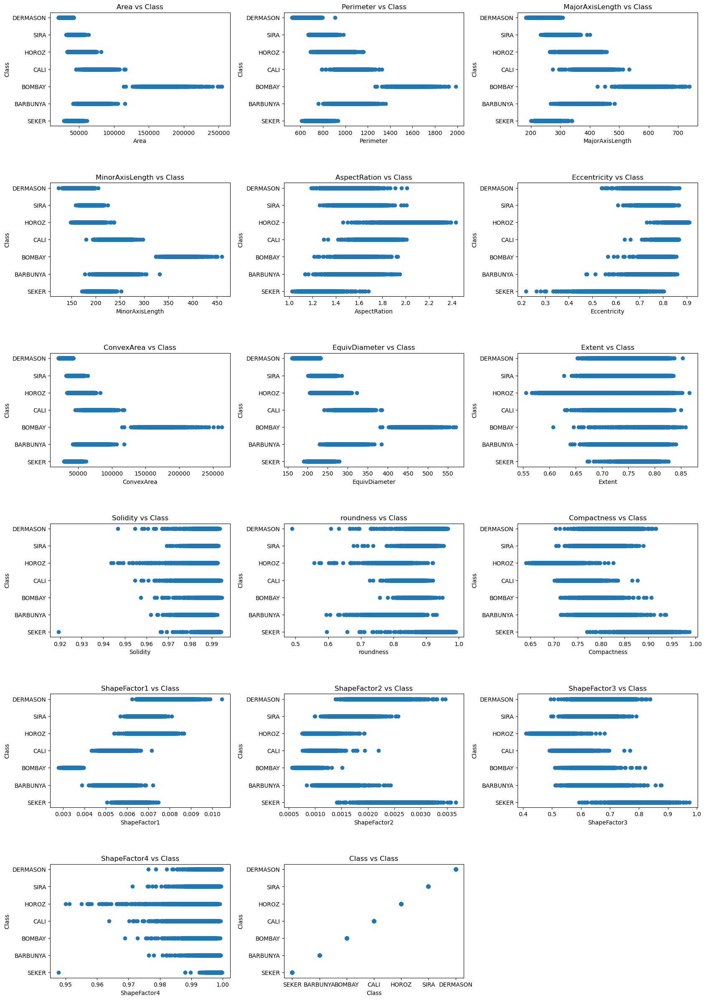

In [30]:
# Set the number of columns for the subplot layout (e.g., 3 columns)
num_columns = 3
num_rows = math.ceil(len(X_train.columns) / num_columns)  # Calculate the number of rows required

# Create a larger figure to accommodate all the subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 5))  # Adjust the size based on your needs
fig.subplots_adjust(hspace=0.5, wspace=0.3)  # Adjust space between plots

# Flatten the axes array for easier indexing in case of multiple rows and columns
axes = axes.flatten()

# Plot each column against the 'Class' column
for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_train[col], X_train['Class'])
    axes[i].set_title(f'{col} vs Class')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Class')

# Hide any unused subplots if the number of plots is less than the grid size
for j in range(i + 1, num_rows * num_columns):
    fig.delaxes(axes[j])

plt.show()

The following data does not help:
- Extent
- Solidity
- ShapeFactor4
- Roundness

## Running on Original Dataset

### Preprocessing Data

In [477]:
def remove_columns(dataframe, labels):
    return dataframe.drop(labels=labels, axis=1)

def normalize_data(dataframe):
    norm_merged_nparr = StandardScaler().fit_transform(dataframe)
    norm_merged_df = pd.DataFrame(data=norm_merged_nparr, columns=dataframe.columns)
    return norm_merged_df

norm_merged_df = remove_columns(X_train, ["Class", "Extent", "Solidity", "ShapeFactor4"])
norm_merged_df = normalize_data(norm_merged_df)
norm_merged_df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,1.423867,1.839116,0.680786,2.402173,1.925723
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.231054,2.495449,0.367967,3.100893,2.689702
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,1.252865,1.764843,0.603129,2.235091,1.841356
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.515049,2.081715,0.401718,2.515075,2.204250
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,1.874992,2.765330,0.118268,3.270983,3.013462


In [480]:
reduced_norm_merged_arr = norm_merged_df.to_numpy()

### KNN Distance Plot

##### Determining number of points

In [482]:
minPts = len(reduced_norm_merged_arr[0])
minPts

13

#### Nearest Neighbour

In [483]:
nbrs = NearestNeighbors(n_neighbors=minPts, algorithm='ball_tree').fit(reduced_norm_merged_arr)

In [484]:
def get_distances(nbrs, dataframe):
    distances, indices = nbrs.kneighbors(dataframe)
    return distances

In [485]:
distances = get_distances(nbrs, reduced_norm_merged_arr)

In [486]:
distances[:]

array([[0.        , 0.3354482 , 0.44447965, ..., 0.63071734, 0.67297667,
        0.67446187],
       [0.        , 0.98717569, 1.05454904, ..., 1.32384376, 1.32932522,
        1.34067113],
       [0.        , 0.28786932, 0.3354482 , ..., 0.51384204, 0.55156898,
        0.58764054],
       ...,
       [0.        , 0.04108265, 0.04970719, ..., 0.13561687, 0.15204468,
        0.15411681],
       [0.        , 0.04749751, 0.06187991, ..., 0.12030383, 0.12101654,
        0.12437409],
       [0.        , 0.04978299, 0.06147165, ..., 0.1290011 , 0.12928579,
        0.13536328]])

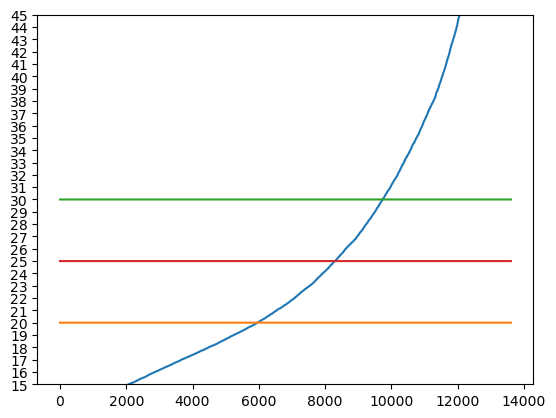

In [488]:
distances = np.sort(distances, axis=0)
new_distances = [i * 100 for i in distances[:,-1]]
plt.ylim(15, 45)
plt.yticks(np.arange(15, 46, 1))
plt.plot(new_distances)
plt.plot([20]*len(new_distances))
plt.plot([30]*len(new_distances))
plt.plot([25]*len(new_distances))

### DBScan

In [489]:
# DBScan
dbsScan = DBSCAN(eps = 26.0/100.0, min_samples=25)
clustering = dbsScan.fit(reduced_norm_merged_arr)
labels = clustering.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 4
Estimated number of noise points: 5047


In [492]:
reduced_norm_merged_df = pd.DataFrame(reduced_norm_merged_arr)
reduced_norm_merged_df["Class"] = X_train["Class"]
reduced_norm_merged_df["Cluster"] = labels

In [493]:
reduced_norm_merged_df.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,Class,Cluster
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,1.423867,1.839116,0.680786,2.402173,1.925723,SEKER,-1
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.231054,2.495449,0.367967,3.100893,2.689702,SEKER,-1
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,1.252865,1.764843,0.603129,2.235091,1.841356,SEKER,-1
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.515049,2.081715,0.401718,2.515075,2.204250,SEKER,-1
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,1.874992,2.765330,0.118268,3.270983,3.013462,SEKER,-1
5,-0.776499,-1.028349,-1.255456,-0.461669,-1.670962,-2.505417,-0.778140,-0.958455,1.185697,2.007128,0.404676,2.411386,2.118134,SEKER,-1
6,-0.769746,-0.864518,-1.273082,-0.405432,-1.769468,-2.841539,-0.765713,-0.947624,-0.339428,2.163463,0.320306,2.561150,2.299123,SEKER,-1
7,-0.768314,-1.052616,-1.250365,-0.434383,-1.693163,-2.577604,-0.769844,-0.945331,1.576462,2.035558,0.368404,2.420627,2.150908,SEKER,-1
8,-0.762653,-1.024830,-1.244094,-0.425044,-1.692102,-2.574111,-0.763228,-0.936283,1.360234,2.038444,0.350458,2.409323,2.154238,SEKER,-1
9,-0.757572,-1.042316,-1.200990,-0.475294,-1.550286,-2.144089,-0.760675,-0.928183,1.629707,1.819147,0.426847,2.168475,1.902999,SEKER,-1


### Visualizing Cluster and Class

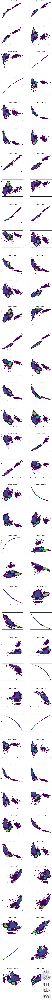

In [509]:
# Define your color map
cmap = plt.get_cmap('viridis')

# Extract unique clusters and classes
unique_cluster = reduced_norm_merged_df['Cluster'].unique()
unique_class = reduced_norm_merged_df['Class'].unique()

# Define markers (one for each unique cluster)
markers = ["+" , "x" , "d" , "v" , "^" , "o", "s"]

# Set the number of columns for the subplot layout (e.g., 3 columns)
num_columns = 2
total = 0
for col in range(len(reduced_norm_merged_df.columns)-2):
    for row in range(col+1, len(reduced_norm_merged_df.columns)-2):
        total += 1
num_rows = math.ceil(total / num_columns)  # Calculate the number of rows required

# Create a larger figure to accommodate all the subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, num_rows * 8))  # Adjust the size based on your needs
fig.subplots_adjust(hspace=0.5, wspace=0.3)  # Adjust space between plots

# Flatten the axes array for easier indexing in case of multiple rows and columns
axes = axes.flatten()

total = -1
for col in range(len(reduced_norm_merged_df.columns)-2):
    for row in range(col+1, len(reduced_norm_merged_df.columns)-2):
        total += 1
        # Loop over each cluster to assign marker and each class to assign color
        for i, cls in enumerate(unique_class):
            cluster_filter = reduced_norm_merged_df['Class'] == cls
            for j, cluster in enumerate(unique_cluster):
                class_filter = reduced_norm_merged_df['Cluster'] == cluster
                combined_filter = cluster_filter & class_filter  # Only plot data that matches both cluster and class
                axes[total].scatter(reduced_norm_merged_df[col][combined_filter], 
                            reduced_norm_merged_df[row][combined_filter], 
                            marker=markers[i % len(markers)],  # Assign marker based on class
                            color=cmap(j / len(unique_cluster)),  # Assign color based on cluster
                            label=f"Cluster {cluster} - Class {cls}")
                axes[total].set_title(f"Component{reduced_norm_merged_df.columns[col]} - Component{reduced_norm_merged_df.columns[row]}")

plt.legend()
plt.show()

<Axes: xlabel='0', ylabel='1'>

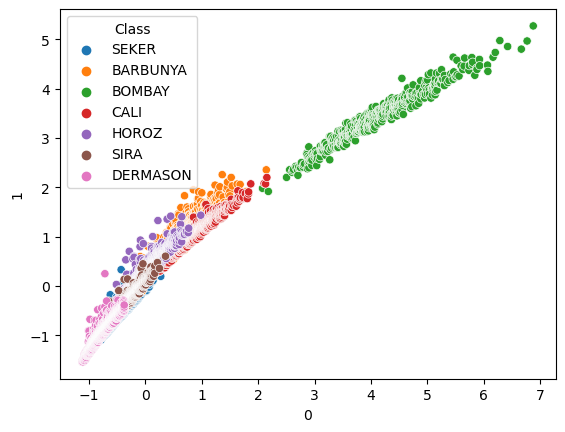

In [455]:
sns.scatterplot(x=reduced_norm_merged_df[0], y=reduced_norm_merged_df[1], hue=reduced_norm_merged_df["Class"])

### Validation

In [456]:
# Validation
### The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters.
silhouette_score(reduced_norm_merged_arr, dbsScan.fit_predict(reduced_norm_merged_arr))

0.1366026002145286

## Running on PCA Dataset

### Preprocessing Data

In [510]:
def remove_columns(dataframe, labels):
    return dataframe.drop(labels=labels, axis=1)

def normalize_data(dataframe):
    norm_merged_nparr = StandardScaler().fit_transform(dataframe)
    norm_merged_df = pd.DataFrame(data=norm_merged_nparr, columns=dataframe.columns)
    return norm_merged_df

norm_merged_df = remove_columns(X_train, ["Class", "Extent", "Solidity", "ShapeFactor4"])
norm_merged_df = normalize_data(norm_merged_df)
norm_merged_df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
0,-0.840749,-1.143319,-1.306598,-0.631153,-1.565053,-2.185720,-0.841451,-1.063341,1.423867,1.839116,0.680786,2.402173,1.925723
1,-0.829188,-1.013924,-1.395911,-0.434445,-1.969784,-3.686040,-0.826102,-1.044217,0.231054,2.495449,0.367967,3.100893,2.689702
2,-0.807157,-1.078829,-1.252357,-0.585735,-1.514291,-2.045336,-0.808704,-1.008084,1.252865,1.764843,0.603129,2.235091,1.841356
3,-0.785741,-0.977215,-1.278825,-0.439290,-1.741618,-2.742211,-0.773975,-0.973337,0.515049,2.081715,0.401718,2.515075,2.204250
4,-0.781239,-1.097384,-1.380471,-0.266663,-2.117993,-4.535028,-0.784286,-0.966080,1.874992,2.765330,0.118268,3.270983,3.013462


### Dimensionality Reduction

#### Principle component analysis

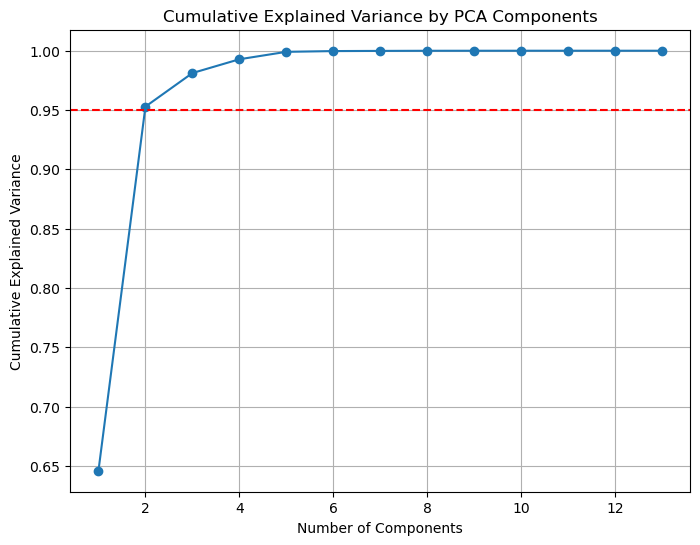

In [511]:
# Dimensionality Reduction
## Principle component analysis
pca = PCA().fit(norm_merged_df)
# Plot the explained variance ratio to choose the number of components
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_.cumsum(), marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Explained Variance')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [512]:
pca = PCA(n_components=4)
def get_reduced_dataframe(pca, norm_merged_df):
    reduced_norm_merged_arr = pca.fit_transform(norm_merged_df)
    return reduced_norm_merged_arr

reduced_norm_merged_arr = get_reduced_dataframe(pca, norm_merged_df)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)
reduced_norm_merged_arr[0]

[0.64600511 0.30688335 0.02828807 0.01162361]
[338.09182493 233.02545139  70.7486811   45.35104222]


array([-4.83652348, -2.12026914, -0.15193728,  0.55548082])

### KNN Distance Plot

##### Determining number of points

In [513]:
minPts = len(reduced_norm_merged_arr[0])
minPts = 25

#### Nearest Neighbour

In [514]:
nbrs = NearestNeighbors(n_neighbors=minPts, algorithm='ball_tree').fit(reduced_norm_merged_arr)

In [515]:
def get_distances(nbrs, dataframe):
    distances, indices = nbrs.kneighbors(dataframe)
    return distances

In [516]:
distances = get_distances(nbrs, reduced_norm_merged_arr)

In [517]:
distances[:]

array([[0.        , 0.32251322, 0.43672899, ..., 0.72694629, 0.73205225,
        0.73815604],
       [0.        , 0.92882846, 1.04400826, ..., 1.42610998, 1.48412824,
        1.48688785],
       [0.        , 0.28054336, 0.32251322, ..., 0.64205471, 0.65527949,
        0.6596683 ],
       ...,
       [0.        , 0.04094832, 0.04809228, ..., 0.17868505, 0.17936594,
        0.18153598],
       [0.        , 0.04709856, 0.06031273, ..., 0.14865087, 0.1555373 ,
        0.15898962],
       [0.        , 0.04827515, 0.06039555, ..., 0.16181994, 0.16285892,
        0.16406158]])

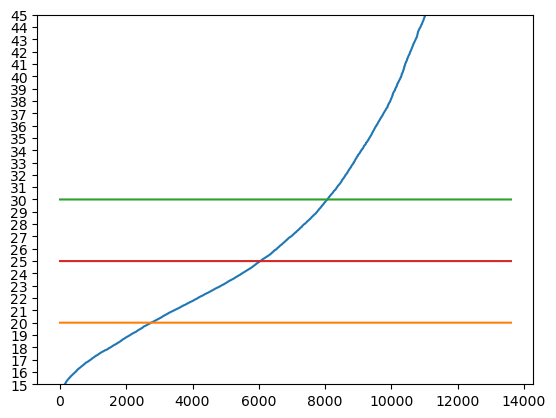

In [518]:
distances = np.sort(distances, axis=0)
new_distances = [i * 100 for i in distances[:,-1]]
plt.ylim(15, 45)
plt.yticks(np.arange(15, 46, 1))
plt.plot(new_distances)
plt.plot([20]*len(new_distances))
plt.plot([30]*len(new_distances))
plt.plot([25]*len(new_distances))

### DBScan

In [519]:
# DBScan
dbsScan = DBSCAN(eps = 26.0/100.0, min_samples=25)
clustering = dbsScan.fit(reduced_norm_merged_arr)
labels = clustering.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 4
Estimated number of noise points: 4834


In [520]:
reduced_norm_merged_df = pd.DataFrame(reduced_norm_merged_arr)
reduced_norm_merged_df["Class"] = X_train["Class"]
reduced_norm_merged_df["Cluster"] = labels

In [521]:
reduced_norm_merged_df.head(10)

,0,1,2,3,Class,Cluster
0,-4.836523,-2.120269,-0.151937,0.555481,SEKER,-1
1,-5.389220,-3.348526,-1.860928,1.155725,SEKER,-1
2,-4.553610,-2.008924,-0.244815,0.501157,SEKER,-1
3,-4.697717,-2.611257,-1.209972,0.798529,SEKER,-1
4,-6.077563,-4.489026,-0.750017,0.665990,SEKER,-1
5,-4.728060,-2.569931,-0.533295,0.532928,SEKER,-1
6,-4.493678,-2.598582,-2.027519,1.049376,SEKER,-1
7,-4.843156,-2.741495,-0.222026,0.405563,SEKER,-1
8,-4.763121,-2.708979,-0.413676,0.460515,SEKER,-1
9,-4.527407,-2.318257,0.024517,0.290265,SEKER,-1


### Visualizing Cluster and Class

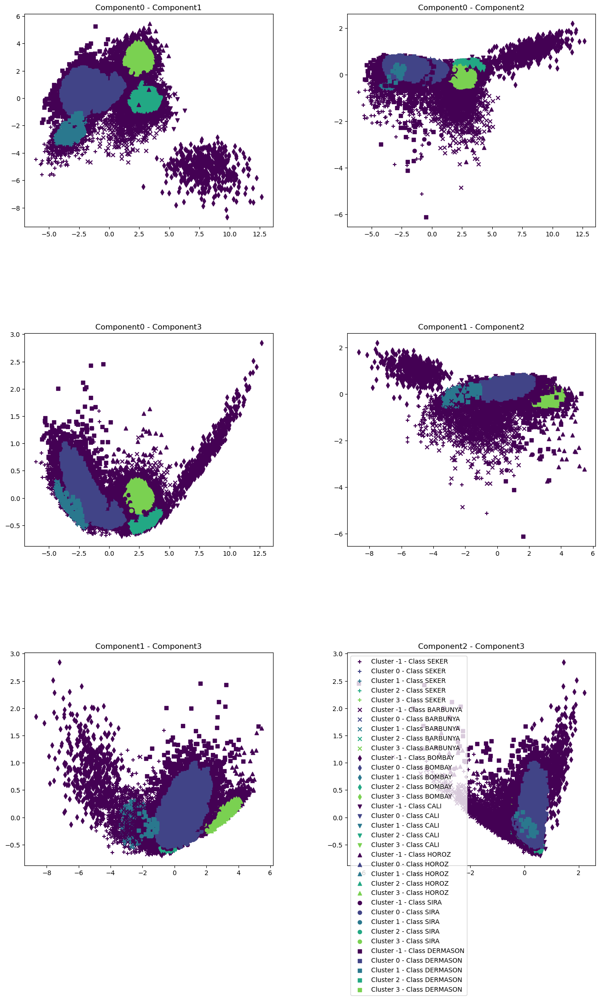

In [522]:
# Define your color map
cmap = plt.get_cmap('viridis')

# Extract unique clusters and classes
unique_cluster = reduced_norm_merged_df['Cluster'].unique()
unique_class = reduced_norm_merged_df['Class'].unique()

# Define markers (one for each unique cluster)
markers = ["+" , "x" , "d" , "v" , "^" , "o", "s"]

# Set the number of columns for the subplot layout (e.g., 3 columns)
num_columns = 2
total = 0
for col in range(len(reduced_norm_merged_df.columns)-2):
    for row in range(col+1, len(reduced_norm_merged_df.columns)-2):
        total += 1
num_rows = math.ceil(total / num_columns)  # Calculate the number of rows required

# Create a larger figure to accommodate all the subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, num_rows * 8))  # Adjust the size based on your needs
fig.subplots_adjust(hspace=0.5, wspace=0.3)  # Adjust space between plots

# Flatten the axes array for easier indexing in case of multiple rows and columns
axes = axes.flatten()

total = -1
for col in range(len(reduced_norm_merged_df.columns)-2):
    for row in range(col+1, len(reduced_norm_merged_df.columns)-2):
        total += 1
        # Loop over each cluster to assign marker and each class to assign color
        for i, cls in enumerate(unique_class):
            cluster_filter = reduced_norm_merged_df['Class'] == cls
            for j, cluster in enumerate(unique_cluster):
                class_filter = reduced_norm_merged_df['Cluster'] == cluster
                combined_filter = cluster_filter & class_filter  # Only plot data that matches both cluster and class
                axes[total].scatter(reduced_norm_merged_df[col][combined_filter], 
                            reduced_norm_merged_df[row][combined_filter], 
                            marker=markers[i % len(markers)],  # Assign marker based on class
                            color=cmap(j / len(unique_cluster)),  # Assign color based on cluster
                            label=f"Cluster {cluster} - Class {cls}")
                axes[total].set_title(f"Component{reduced_norm_merged_df.columns[col]} - Component{reduced_norm_merged_df.columns[row]}")

plt.legend()
plt.show()

<Axes: xlabel='0', ylabel='1'>

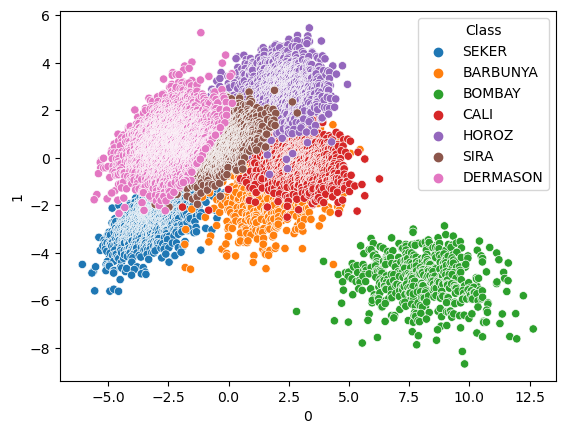

In [523]:
sns.scatterplot(x=reduced_norm_merged_df[0], y=reduced_norm_merged_df[1], hue=reduced_norm_merged_df["Class"])

### Validation

In [524]:
# Validation
### The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters.
silhouette_score(reduced_norm_merged_arr, dbsScan.fit_predict(reduced_norm_merged_arr))

0.15172229498462186

## Visualization Tool

In [525]:
# Visualization
umapReducer = umap.UMAP()#random_state=42)
def get_UMAP_embedding(umap, dataframe):
    umap.fit(dataframe)
    embedding = umap.transform(dataframe)
    # Verify that the result of calling transform is
    # idenitical to accessing the embedding_ attribute
    assert(np.all(embedding == umap.embedding_))
    return embedding

def displayUMAP(embedding, dataframe):
    embedding_df = pd.DataFrame(embedding, columns=('x', 'y'))
    for column in dataframe.columns:
        embedding_df[column.replace(" ", "").replace("-", "")] = [str(x) for x in dataframe[column]]

    datasource = ColumnDataSource(embedding_df)
    color_mapping = CategoricalColorMapper(factors=dataframe["Class"].unique(), palette=Spectral10)

    plot_figure = figure(
        title=f'UMAP projection of the Attrition dataset',
        width=1000,
        height=1000,
        tools=('pan, wheel_zoom, reset')
    )

    tooltip = """"""
    for column in dataframe.columns:
        tooltip += f"""<div>
            <span style='font-size: 10px; color: #224450'>{column}:</span>
            <span style='font-size: 10px'>@{column.replace(" ", "").replace("-", "")}</span>
        </div>"""

    plot_figure.add_tools(HoverTool(tooltips=f"""
    <div>
        {tooltip}
    </div>
    """))

    plot_figure.circle(
        'x',
        'y',
        source=datasource,
        color=dict(field='Class', transform=color_mapping),
        line_alpha=0.6,
        fill_alpha=0.6,
        size=4
    )
    show(plot_figure)

umap_embedding = get_UMAP_embedding(umapReducer, norm_merged_df)
displayUMAP(umap_embedding, X_train)
